#Training Generative Adversarial Networks (GANs) in PyTorch

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/drive/MyDrive/kaggle competitions/"

In [ ]:
!mkdir './animefacedataset'
%cd './animefacedataset'

/content/animefacedataset


In [ ]:
!kaggle datasets download -d splcher/animefacedataset

 98% 385M/395M [00:12<00:00, 33.7MB/s]
100% 395M/395M [00:12<00:00, 33.3MB/s]


In [ ]:
data_dir = '/content/animefacedataset'

In [ ]:
os.listdir(data_dir)

['animefacedataset.zip']

In [ ]:
!unzip '/content/animefacedataset/animefacedataset.zip'

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: images/62764_2019.jpg   
  inflating: images/62765_2019.jpg   
  inflating: images/62766_2019.jpg   
  inflating: images/62767_2019.jpg   
  inflating: images/62768_2019.jpg   
  inflating: images/62769_2019.jpg   
  inflating: images/6276_2003.jpg    
  inflating: images/62770_2019.jpg   
  inflating: images/62771_2019.jpg   
  inflating: images/62772_2019.jpg   
  inflating: images/62773_2019.jpg   
  inflating: images/62774_2019.jpg   
  inflating: images/62775_2019.jpg   
  inflating: images/62776_2019.jpg   
  inflating: images/62777_2019.jpg   
  inflating: images/62778_2019.jpg   
  inflating: images/62779_2019.jpg   
  inflating: images/6277_2003.jpg    
  inflating: images/62780_2019.jpg   
  inflating: images/62781_2019.jpg   
  inflating: images/62782_2019.jpg   
  inflating: images/62783_2019.jpg   
  inflating: images/62784_2019.jpg   
  inflating: images/62785_2019.jpg   
  inflating: images/

In [ ]:
len(os.listdir(os.path.join(data_dir, 'images')))

63565

In [ ]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [ ]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [ ]:
train_ds = ImageFolder(data_dir, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))
train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=2, pin_memory=True)

In [ ]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
def denorm(img_tensors):
  return img_tensors * stats[1][0] + stats[0][0]

In [ ]:
def show_images(images, nmax=64):
  fig, ax = plt.subplots(figsize=(12,12))
  ax.set_xticks([]); ax.set_yticks([])
  ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
  for images, _ in dl:
    show_images(images, nmax)
    break

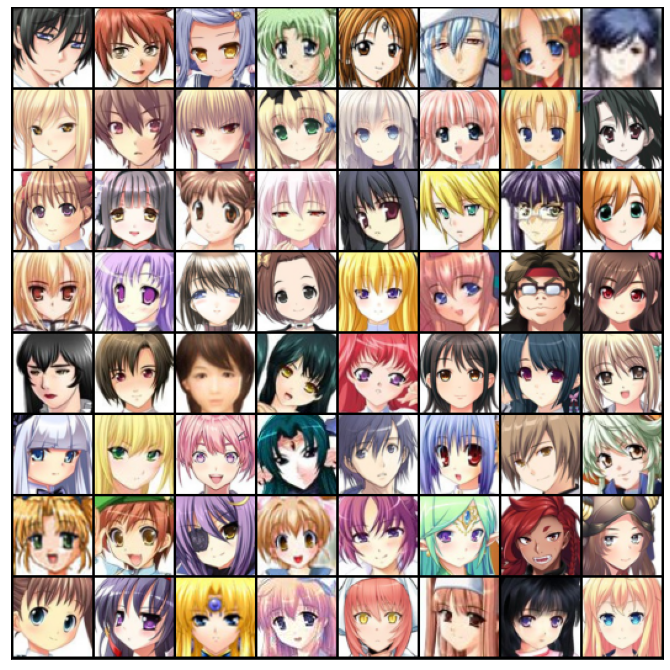

In [ ]:
show_batch(train_dl)

In [ ]:
def get_default_device():
  return torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

def to_device(data, device):
  if isinstance(data, (list, tuple)):
    return [to_device(x, device) for x in data]
  return data.to(device, non_blocking=True)

class DeviceDataLoader():
  def __init__(self, dl, device):
    self.dl = dl
    self.device = device
  def __iter__(self):
    for b in self.dl:
      yield to_device(b, self.device)
  def __len__(self):
    return len(self.dl)

In [ ]:
device = get_default_device()
device

device(type='cuda')

In [ ]:
train_dl = DeviceDataLoader(train_dl, device)

##Discriminator network
This discriminator takes an image as input, and tries to classify it as 'real' or 'generated'. In this sense, it's like any other neural network. We'll use a convolutional neural network (CNN) which outputs a single number output for every image. We'll use stride of 2 to progressively reduce the size of the output feature map.

In [ ]:
import torch.nn as nn

In [ ]:
discriminator = nn.Sequential(
    # IN: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # OUTL 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [ ]:
discriminator = to_device(discriminator, device)

## Generator Network
The input to the generator is typically a vector or a matrix of random numbers (referred to as a latent tensor) which is used as a seed for generating an image. The generator will convert a latent tensor of shape `(128, 1, 1)` into an image tensor of shape `3 x 64 x 64`. To achieve this, we'll use the `ConvTranspose2d` layer from PyTorch, which is performs as a *transpose convolution* (also referred to as a deconvolution).

In [ ]:
latent_size = 128

In [ ]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    #128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


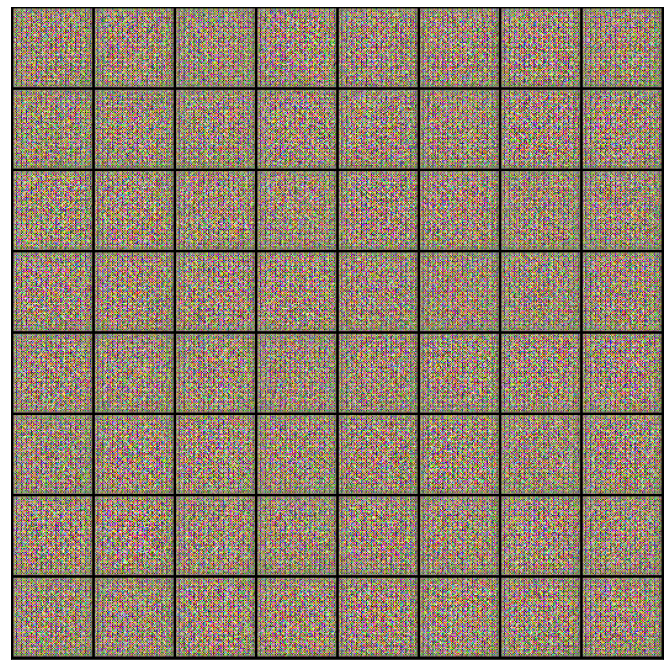

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [ ]:
generator = to_device(generator, device)

##Discriminator training
Since descriminator is a binary classification model, we can use binary cross-entropy loss function to quantify how well it is able to diffirintiate between real and generated images.

In [ ]:
import torch.nn.functional as F

In [ ]:
def train_discriminator(real_images, opt_d):
  # Clear discriminator gradients
  opt_d.zero_grad()

  # Pass real images through discriminator
  real_preds = discriminator(real_images)
  real_targets = torch.ones(real_images.size(0), 1, device=device)
  real_loss = F.binary_cross_entropy(real_preds, real_targets)
  real_score = torch.mean(real_preds).item()

  # Generate fake images
  latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
  fake_images = generator(latent)

  # Pass fake images through discriminator
  fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
  fake_preds = discriminator(fake_images)
  fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
  fake_score = torch.mean(fake_preds).item()

  # Upgrade discriminator weights
  loss = real_loss + fake_loss
  loss.backward()
  opt_d.step()
  return loss.item(), real_score, fake_score

Steps involved in training the discriminator.
- We expect the discriminator to output 1 if the image was picked from the real dataset and 0 if it was generated using the generator network.
- We first pass a batch of real images, and compute the loss, setting the target labels to 1.
- Then we pass a batch of fake images (generated using generator) into the discriminator, and compute loss, setting the target labels to 0.
- Finally we add the two losses and use the overall loss to perform gradient descent to adjust the weight of the discriminator.

It's important to note that we don't change the weight of the generator model while training discriminator (`opt_d` only affects the `discriminator.parameters()`)

## Generator training
Since the outputs of the generator are images, it's not obvious how we can train the generator. This is where we eplouy rather elegant trick, which is to use the discriminator as a part of the loss function. Here's how it works:
- We generate a batch of images using generator, pass them into the discriminator.
- We calculate the loss by setting the target labels to 1 i.e. real. We do this bacause the generator's objective is to "fool" the discriminator.
- We use the loss to perform gradient descent i.e. change the weights of the generator, so it gets better at generating real-like images to 'fool' the discriminator

In [ ]:
def train_generator(opt_g):
  # Clear generator gradients
  opt_g.zero_grad()

  # Generate fake images
  latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
  fake_images = generator(latent)

  # Try to fool the discriminator
  preds = discriminator(fake_images)
  targets = torch.ones(batch_size, 1, device=device)
  loss = F.binary_cross_entropy(preds, targets)

  # Update generator weights
  loss.backward()
  opt_g.step()

  return loss.item()

In [ ]:
from torchvision.utils import save_image

In [ ]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [ ]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


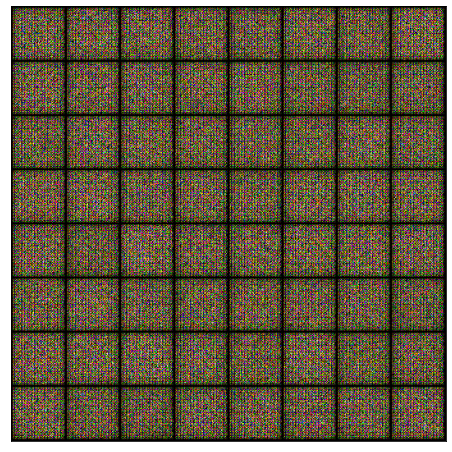

In [ ]:
save_samples(0, fixed_latent)

## Full Training Loop
Let's define a `fit` function to train the discriminator and generator in tandem for each batch of training data. We'll use the Adam optimizer with some custom parameters (betas) that are known to work well for GANs. We will also save some sample generated images at regular intervals for inspection.
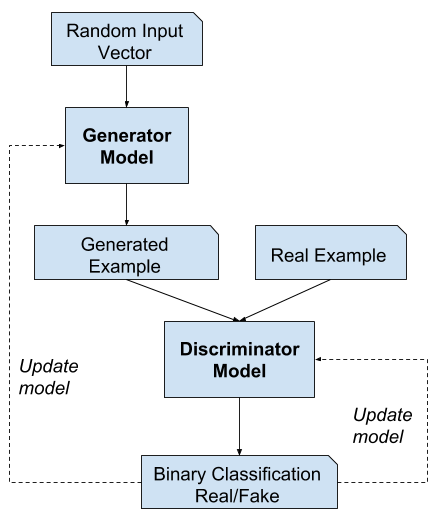

In [ ]:
from tqdm.notebook import tqdm

In [ ]:
def fit(epochs, lr, start_idx=1):
  torch.cuda.empty_cache()

  # Losses and scores
  losses_g = []
  losses_d = []
  real_scores = []
  fake_scores = []

  # Create optimizers
  opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
  opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

  for epoch in range(epochs):
    for real_images, _ in tqdm(train_dl):
      # Train discriminator
      loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
      # Train generator
      loss_g = train_generator(opt_g)

    # Record losses & scores
    losses_g.append(loss_g)
    losses_d.append(loss_d)
    real_scores.append(real_score)
    fake_scores.append(fake_score)

    # Log losses & scores (last batch)
    print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

    # Save generated images
    save_samples(epoch+start_idx, fixed_latent, show=False)

  return losses_g, losses_d, real_scores, fake_scores


In [ ]:
lr = 0.0002
epochs = 25

In [ ]:
history = fit(epochs, lr)

  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [1/25], loss_g: 6.5342, loss_d: 0.6161, real_score: 0.8782, fake_score: 0.3537
Saving generated-images-0001.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [2/25], loss_g: 11.2054, loss_d: 0.9064, real_score: 0.9213, fake_score: 0.5169
Saving generated-images-0002.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [3/25], loss_g: 6.0121, loss_d: 0.1999, real_score: 0.8705, fake_score: 0.0246
Saving generated-images-0003.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [4/25], loss_g: 5.0644, loss_d: 0.2345, real_score: 0.8978, fake_score: 0.0995
Saving generated-images-0004.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [5/25], loss_g: 2.8050, loss_d: 0.0490, real_score: 0.9919, fake_score: 0.0390
Saving generated-images-0005.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [6/25], loss_g: 5.7253, loss_d: 0.2107, real_score: 0.9321, fake_score: 0.1133
Saving generated-images-0006.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [7/25], loss_g: 11.1480, loss_d: 0.4065, real_score: 0.9489, fake_score: 0.2612
Saving generated-images-0007.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [8/25], loss_g: 10.4881, loss_d: 0.2608, real_score: 0.8311, fake_score: 0.0011
Saving generated-images-0008.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [9/25], loss_g: 9.3413, loss_d: 0.4377, real_score: 0.7169, fake_score: 0.0001
Saving generated-images-0009.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [10/25], loss_g: 15.1565, loss_d: 0.3716, real_score: 0.9772, fake_score: 0.2627
Saving generated-images-0010.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [11/25], loss_g: 4.8097, loss_d: 0.1092, real_score: 0.9362, fake_score: 0.0284
Saving generated-images-0011.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [12/25], loss_g: 6.3643, loss_d: 0.0706, real_score: 0.9587, fake_score: 0.0222
Saving generated-images-0012.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [13/25], loss_g: 12.6114, loss_d: 0.0166, real_score: 0.9885, fake_score: 0.0022
Saving generated-images-0013.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [14/25], loss_g: 13.2403, loss_d: 0.2253, real_score: 0.8784, fake_score: 0.0001
Saving generated-images-0014.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [15/25], loss_g: 6.0598, loss_d: 0.0318, real_score: 0.9806, fake_score: 0.0110
Saving generated-images-0015.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [16/25], loss_g: 7.9983, loss_d: 0.0957, real_score: 0.9894, fake_score: 0.0731
Saving generated-images-0016.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [17/25], loss_g: 5.4886, loss_d: 0.0754, real_score: 0.9808, fake_score: 0.0495
Saving generated-images-0017.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [18/25], loss_g: 15.4620, loss_d: 0.2932, real_score: 0.9817, fake_score: 0.1717
Saving generated-images-0018.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [19/25], loss_g: 6.5586, loss_d: 0.0477, real_score: 0.9675, fake_score: 0.0117
Saving generated-images-0019.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [20/25], loss_g: 5.5837, loss_d: 0.0535, real_score: 0.9722, fake_score: 0.0227
Saving generated-images-0020.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [21/25], loss_g: 6.9538, loss_d: 0.0594, real_score: 0.9741, fake_score: 0.0244
Saving generated-images-0021.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [22/25], loss_g: 12.5296, loss_d: 0.2526, real_score: 0.9997, fake_score: 0.1990
Saving generated-images-0022.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [23/25], loss_g: 4.5994, loss_d: 0.0610, real_score: 0.9741, fake_score: 0.0302
Saving generated-images-0023.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [24/25], loss_g: 11.0233, loss_d: 0.0379, real_score: 0.9882, fake_score: 0.0226
Saving generated-images-0024.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [25/25], loss_g: 6.6167, loss_d: 0.0482, real_score: 0.9740, fake_score: 0.0175
Saving generated-images-0025.png


In [ ]:
from IPython.display import Image

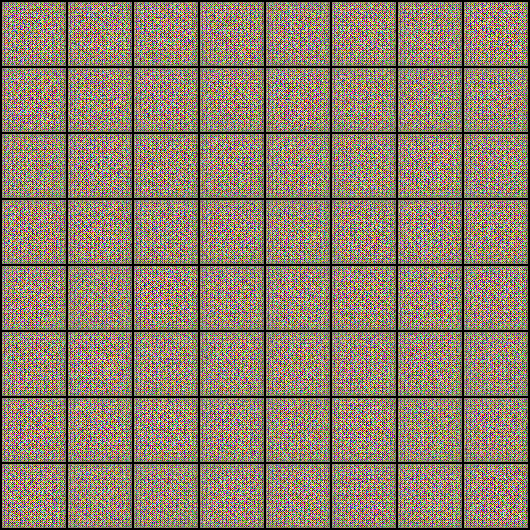

In [ ]:
Image('/content/animefacedataset/generated/generated-images-0000.png')

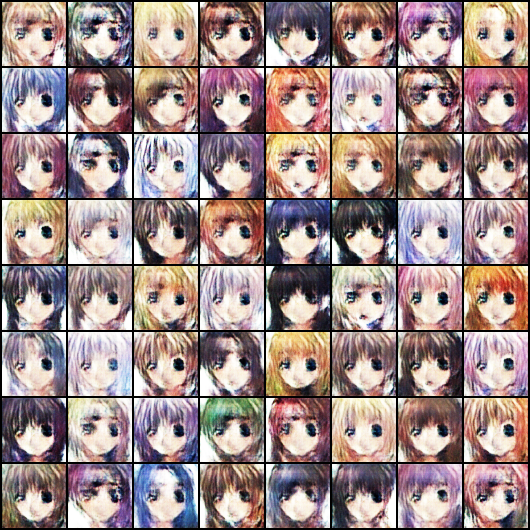

In [ ]:
Image('/content/animefacedataset/generated/generated-images-0005.png')

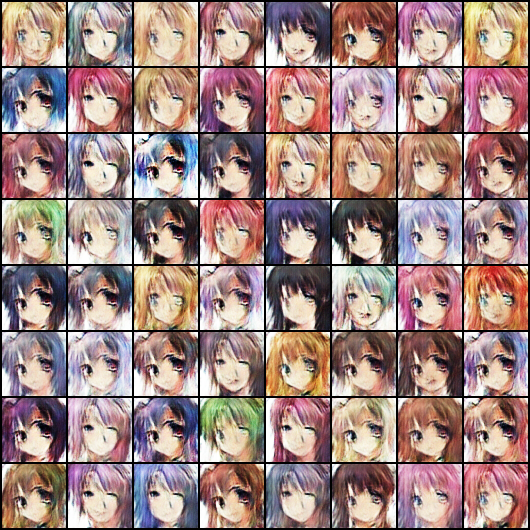

In [ ]:
Image('/content/animefacedataset/generated/generated-images-0010.png')

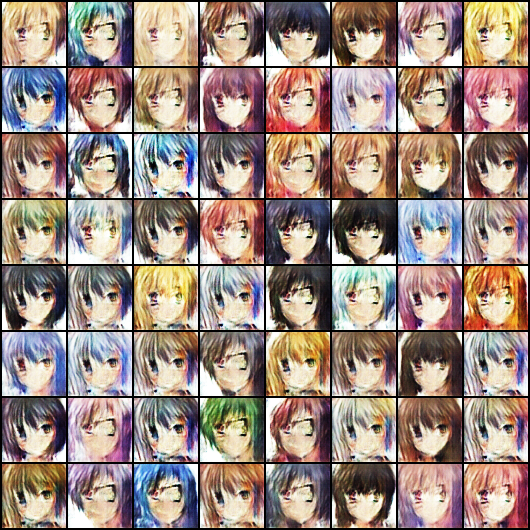

In [ ]:
Image('/content/animefacedataset/generated/generated-images-0015.png')

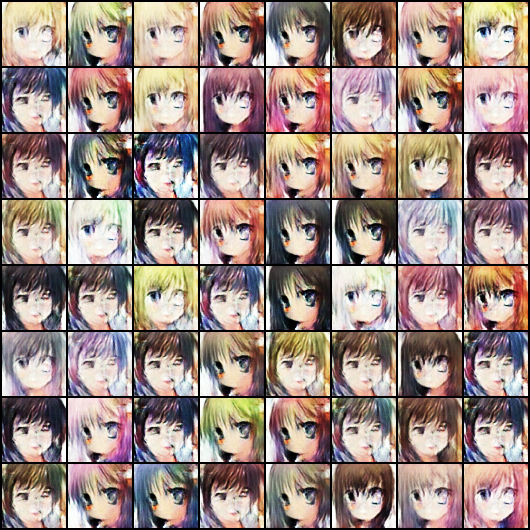

In [ ]:
Image('/content/animefacedataset/generated/generated-images-0020.png')

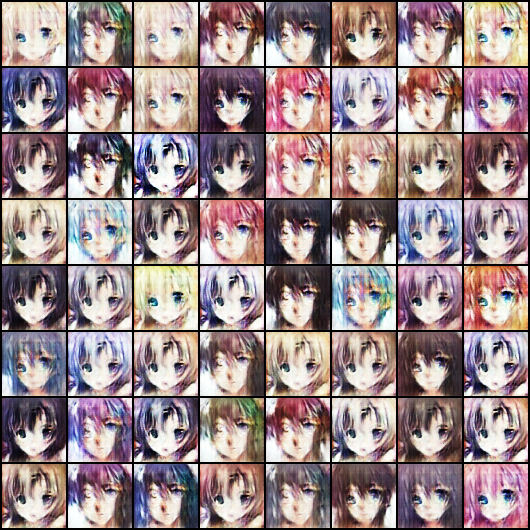

In [ ]:
Image('/content/animefacedataset/generated/generated-images-0024.png')

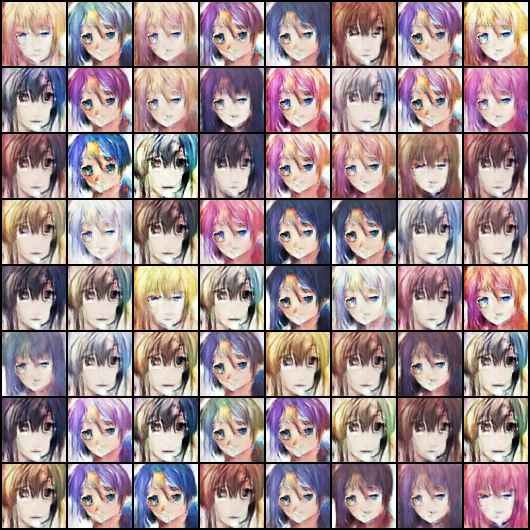

In [ ]:
Image('/content/animefacedataset/generated/generated-images-0025.png')

In [ ]:
import cv2
#import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

In [ ]:
# Save the model checkpoints
torch.save(generator.state_dict(), '/content/animefacedataset/G.pth')
torch.save(discriminator.state_dict(), '/content/animefacedataset/D.pth')

In [ ]:
#%cd '/content/animefacedataset'
#!rmdir --ignore-fail-on-non-empty '/content/animefacedataset/images'
!cp  '/content/animefacedataset/D.pth' '/content/drive/MyDrive/kaggle competitions/animefacedataset'
!cp  '/content/animefacedataset/G.pth' '/content/drive/MyDrive/kaggle competitions/animefacedataset'
!cp  '/content/animefacedataset/gans_training.avi' '/content/drive/MyDrive/kaggle competitions/animefacedataset'
!cp  -r '/content/animefacedataset/generated' '/content/drive/MyDrive/kaggle competitions/animefacedataset'